In [1]:
%load_ext autoreload
%autoreload 2

import xarray as xr
import numpy as np
import pandas as pd
from antarctic_plots import maps, utils, regions, fetch, profile

In [2]:
region = regions.west_antarctica

In [3]:
%%capture
# EIGEN 6C4 geoid model
geoid = fetch.geoid(
    region=region,
)

# geoid model provided with bedmachine
bedmachine_geoid = fetch.bedmachine(
    layer="geoid",
    region=region,
)

# geoid model provided with bedmap2
bedmap2_geoid = fetch.bedmap2(
    layer="gl04c_geiod_to_WGS84",
    region=region,
)

In [4]:
%%capture
# bedmachine surface relative to geoid
bedmachine_surface_g = fetch.bedmachine(
    layer="surface",
    region=region,
)

# bedmachine surface relative to ellipsoid
bedmachine_surface_e = fetch.bedmachine(
    layer="surface",
    region=region,
    reference="ellipsoid",
)

# bedmap2 surface relative to geoid
bedmap2_surface_g = fetch.bedmap2(
    layer="surface",
    region=region,
)

# bedmap2 surface relative to ellipsoid
bedmap2_surface_e = fetch.bedmap2(
    layer="surface",
    region=region,
    reference="ellipsoid",
)

grid spacings don't match, using smaller spacing (500.0m).
Warning, requested spacing (500.0) is smaller than the original  (5000.0).
returning original grid


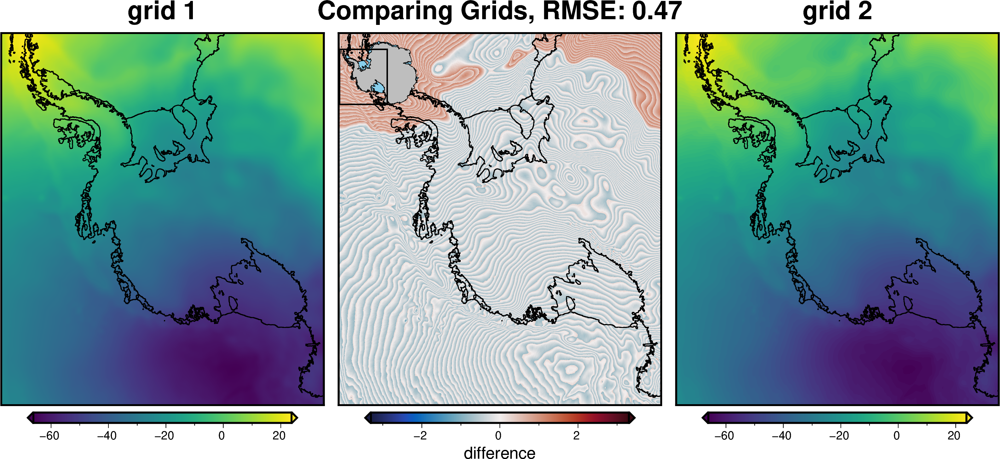

In [5]:
# compare EIGEN geoid with geoid from bedmachine
grids = utils.grd_compare(geoid, bedmachine_geoid, plot=True)

grid spacings don't match, using smaller spacing (1000.0m).
Warning, requested spacing (1000.0) is smaller than the original  (5000.0).
returning original grid


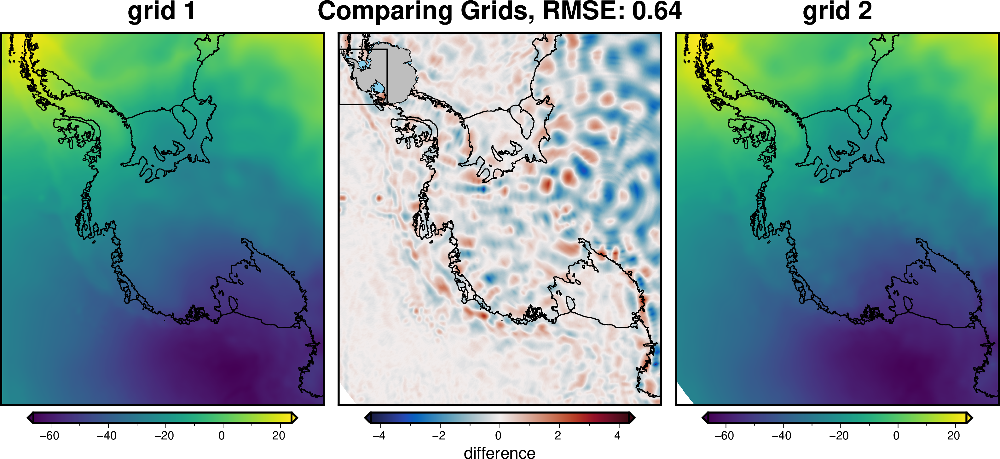

In [6]:
# compare EIGEN geoid with geoid from bedmap2
grids = utils.grd_compare(geoid, bedmap2_geoid, plot=True)

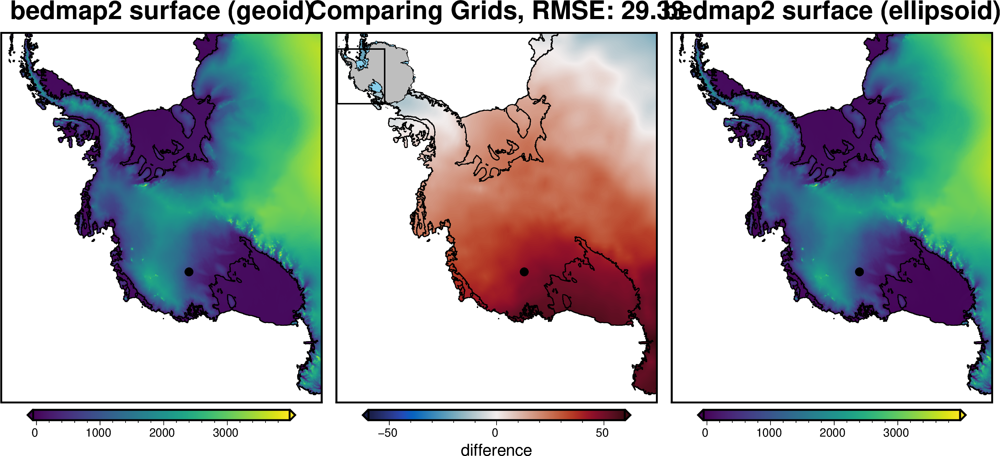

In [10]:
# create a single point to sample values at
df = pd.DataFrame(data={"x": [-800e3], "y": [-800e3]})

# compare bedmap2 surface relative to geoid and ellipsoid
grids = utils.grd_compare(
    bedmap2_surface_g,
    bedmap2_surface_e,
    plot=True,
    grid1_name="bedmap2 surface (geoid)",
    grid2_name="bedmap2 surface (ellipsoid)",
    points=df,
)

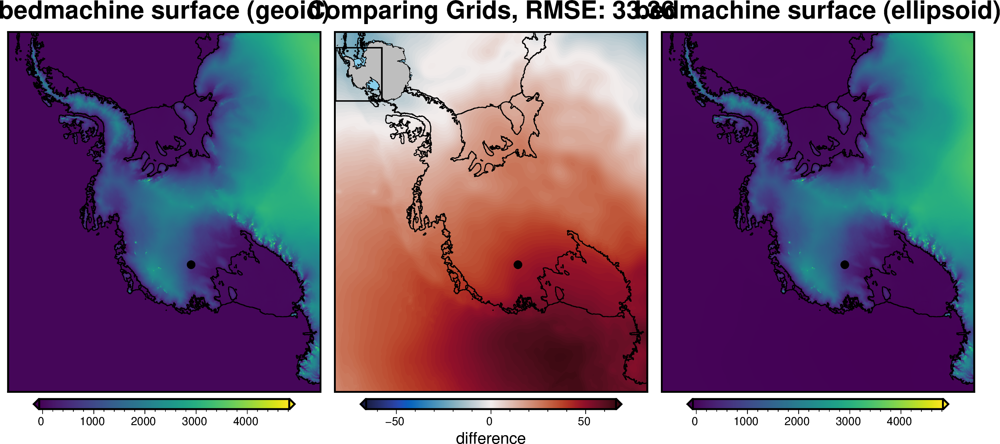

In [8]:
# create a single point to sample values at
df = pd.DataFrame(data={"x": [-800e3], "y": [-800e3]})

# compare bedmachine surface relative to geoid and ellipsoid
grids = utils.grd_compare(
    bedmachine_surface_g,
    bedmachine_surface_e,
    plot=True,
    grid1_name="bedmachine surface (geoid)",
    grid2_name="bedmachine surface (ellipsoid)",
    points=df,
)

In [ ]:
# Sample all the above grids at a point in West Antarctic
df = profile.sample_grids(df, bedmap2_surface_g, name="bedmap2_surface_g")
df = profile.sample_grids(df, bedmap2_surface_e, name="bedmap2_surface_e")

df = profile.sample_grids(df, bedmachine_surface_g, name="bedmachine_surface_g")
df = profile.sample_grids(df, bedmachine_surface_e, name="bedmachine_surface_e")

df = profile.sample_grids(df, geoid, name="geoid")
df = profile.sample_grids(df, bedmap2_geoid, name="bedmap2_geoid")
df = profile.sample_grids(df, bedmachine_geoid, name="bedmachine_geoid")

df

# Findings

* BedMachine geoid = EIGEN 6C4 geoid
* BedMap2 geoid ~ EIGEN 6C4 geoid

* both datasets provide grids referenced to the geoid
* both state to convert to be referenced to the WGS84 ellipsoid **add** their geoid grids

    * BedMachine: "To convert the heights to heights referenced to the WGS84 ellipsoid, simply add the geoid height using the geoid provided in the netCDF file: $ z_{ellipsoid} = z_{geoid} + geoid $"

    * Bedmap2: "to convert back to WGS84, add this grid (EIGEN-GL04C)"
        * "The bedmap2_readme .txt file incorrectly stated that the gl04c_geoid_to_wgs84 grid should be subtracted from the Bedmap2 grids to convert to WGS84. It should be added."

<img src="../figures/ellipsoid_geoid.svg" width="400"/>



Example for West Antarctica 
___

$ geoid = -50 $  

$ Z_{geoid} = 700 $

so since geoid is -50m, the geoid is 50m **below** the ellipsoid, so an ellipsoid-referenced value should be 50m **less** than a geoid-referenced value. 

Therefore:

$ Z_{ellipsoid} = 700 + (-45) = 650 $

$
Z_{geoid} = Z_{ellipsoid} - geoid
$

$
Z_{ellipsoid} = Z_{geoid} + geoid
$

# Compare with REMA

In [11]:
REMA = fetch.REMA(
    version=500,
    region=region,
)

returning grid with new region and/or registration, same spacing


grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from 570000 to 570250
grdcut [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: s reset from -2150000 to -2150250
grdcut [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: n reset from 1670000 to 1670250


grid regions dont match, using inner region [-2700000.0, 570000.0, -2150000.0, 1670000.0]
returning grid with new region and/or registration, same spacing
returning original grid


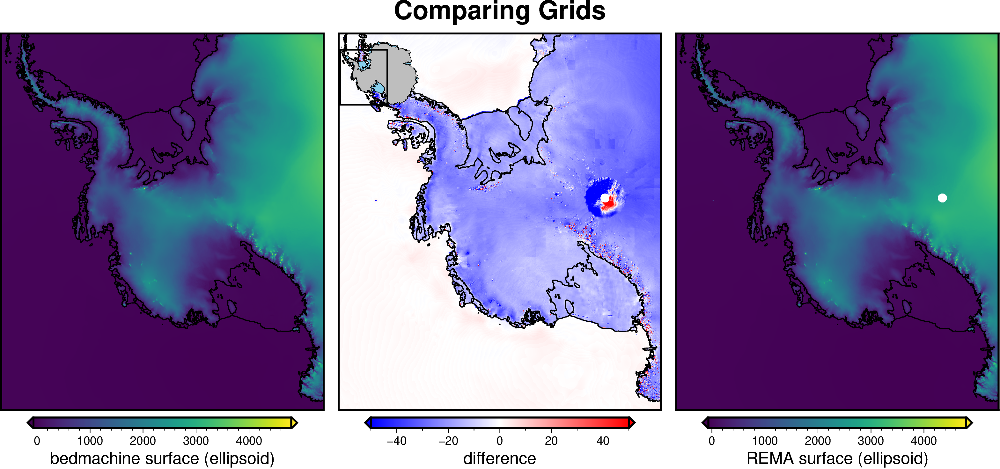

In [12]:
# compare bedmachine surface relative to ellipsoid with REMA surface
grids = utils.grd_compare(
    bedmachine_surface_e,
    REMA,
    plot=True,
    grid1_name="bedmachine surface (ellipsoid)",
    grid2_name="REMA surface (ellipsoid)",
    diff_maxabs=50,
)

Bedmachine surface is lower than REMA since Bedmachine surface is the **ice_equivalent** surface. Need to account for the firn correction to bring up to match REMA.

Firn correction are positive values, so need to add the bedmachine surface

In [14]:
bedmachine_firn = fetch.bedmachine(
    layer="firn",
    region=region,
)
utils.get_grid_info(bedmachine_firn)

returning grid with new region and/or registration, same spacing


('500', [-2740000.0, 570000.0, -2150000.0, 1670000.0], 0.0, 48.5109672546, 'g')

grid regions dont match, using inner region [-2700000.0, 570000.0, -2150000.0, 1670000.0]
returning grid with new region and/or registration, same spacing
returning original grid


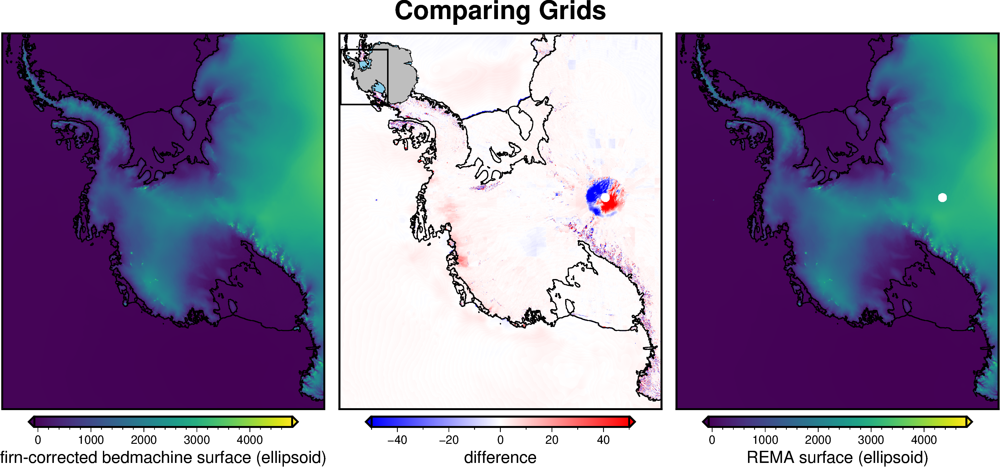

In [16]:
# add firn correction to surface
bedmachine_surface_e_firn_corr = bedmachine_surface_e + bedmachine_firn

# compare firn-corrected bedmachine surface relative to ellipsoid with REMA surface
grids = utils.grd_compare(
    bedmachine_surface_e_firn_corr,
    REMA,
    plot=True,
    grid1_name="firn-corrected bedmachine surface (ellipsoid)",
    grid2_name="REMA surface (ellipsoid)",
    diff_maxabs=50,
)

grid spacings don't match, using smaller spacing (500.0m).
grid regions dont match, using inner region [-2700000.0, 570000.0, -2150000.0, 1670000.0]
Warning, requested spacing (500.0) is smaller than the original  (1000.0).
returning original grid


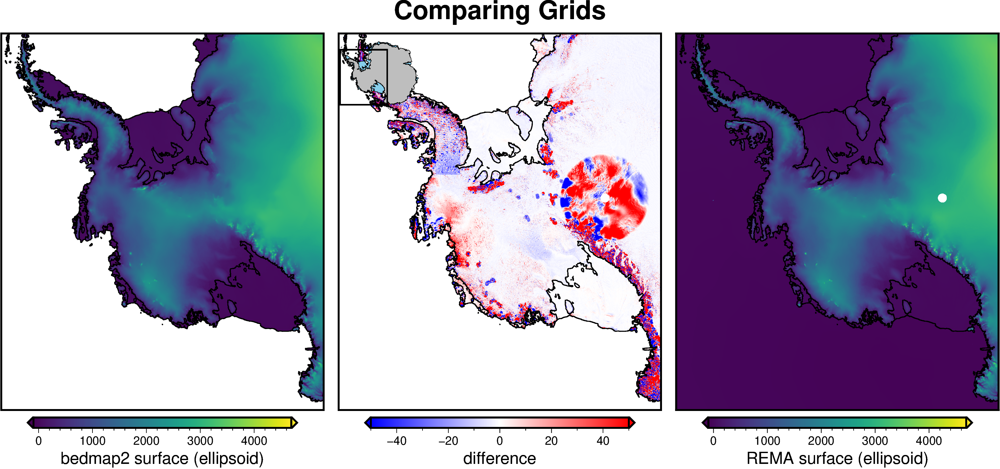

In [13]:
# compare bedmap2 surface relative to ellipsoid with REMA surface
grids = utils.grd_compare(
    bedmap2_surface_e,
    REMA,
    plot=True,
    grid1_name="bedmap2 surface (ellipsoid)",
    grid2_name="REMA surface (ellipsoid)",
    diff_maxabs=50,
)

Bedmap2 surface seems to roughly match REMA since they report the true (not ice-equivalent) surface.